In [42]:
import folium
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from folium.plugins import MarkerCluster

In [5]:
data = pd.read_csv("/kaggle/input/restaurant-dataset/Cognifyz_Dataset.csv")
data.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [7]:
map_center = [data['Latitude'].mean(), data['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12,control_scale=True, prefer_canvas=True, tiles='cartodbpositron', lang='en')

In [9]:
marker_cluster = MarkerCluster().add_to(restaurant_map)
for idx, row in data.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(marker_cluster)

restaurant_map

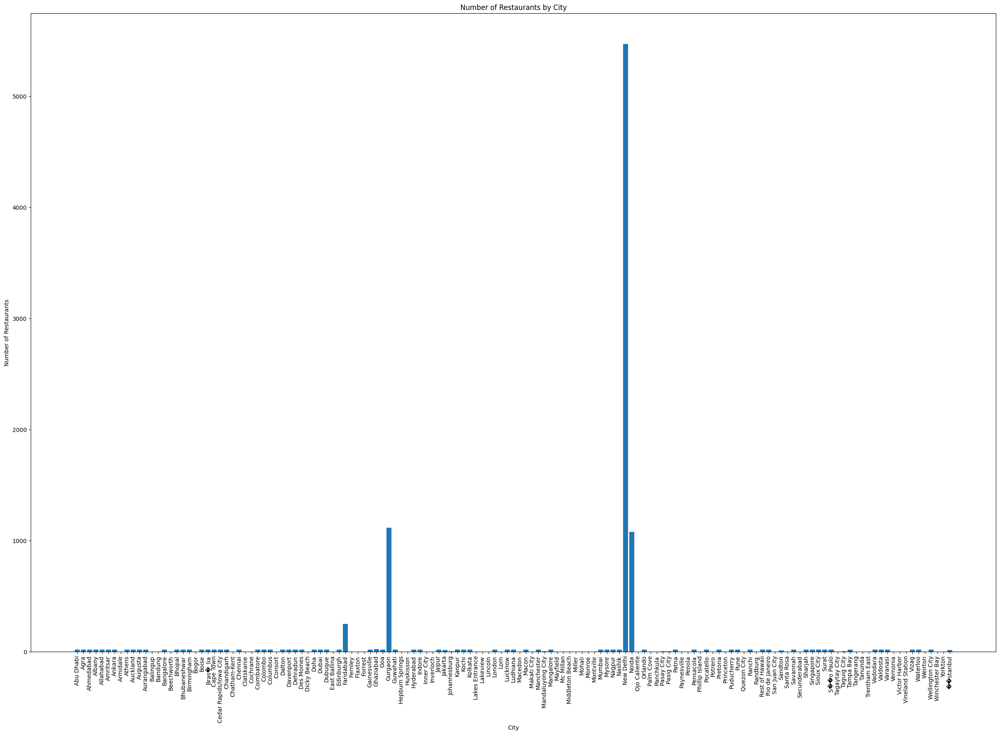

In [18]:
restaurants_by_city = data.groupby('City')['Restaurant ID'].count().reset_index()
restaurants_by_city = restaurants_by_city.rename(columns={'Restaurant ID': 'Count'})

plt.figure(figsize=(30, 20))
plt.bar(restaurants_by_city['City'], restaurants_by_city['Count'])
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.title('Number of Restaurants by City')
plt.xticks(rotation=90)
plt.show()

In [20]:
avg_rating_by_city = data.groupby('City')['Aggregate rating'].mean().reset_index()
avg_rating_by_city.head()

,City,Aggregate rating
0,Abu Dhabi,4.300000
1,Agra,3.965000
2,Ahmedabad,4.161905
3,Albany,3.555000
4,Allahabad,3.395000


In [25]:
popular_cuisines_by_city = data.dropna(subset=['Cuisines']).groupby('City')['Cuisines'].apply(lambda x: ', '.join(x)).reset_index()
popular_cuisines_by_city.head()

,City,Cuisines
0,Abu Dhabi,"American, American, Italian, Pizza, Turkish, A..."
1,Agra,"North Indian, Mughlai, North Indian, Mughlai, ..."
2,Ahmedabad,"Chinese, Italian, North Indian, Mexican, Medit..."
3,Albany,"BBQ, Burger, Seafood, American, BBQ, Mexican, ..."
4,Allahabad,"North Indian, South Indian, Fast Food, Cafe, F..."


In [28]:
avg_price_by_city = data.groupby('City')['Average Cost for two'].mean().reset_index()
avg_price_by_city.head()

,City,Average Cost for two
0,Abu Dhabi,182.000000
1,Agra,1065.000000
2,Ahmedabad,857.142857
3,Albany,19.750000
4,Allahabad,517.500000


In [31]:
correlation_matrix = data[['Latitude', 'Longitude', 'Aggregate rating', 'Average Cost for two']].corr()
correlation_matrix

,Latitude,Longitude,Aggregate rating,Average Cost for two
Latitude,1.000000,0.043207,0.000516,-0.111088
Longitude,0.043207,1.000000,-0.116818,0.045891
Aggregate rating,0.000516,-0.116818,1.000000,0.051792
Average Cost for two,-0.111088,0.045891,0.051792,1.000000


In [33]:
X = data[['Latitude', 'Longitude']]
model_kmeans = KMeans(n_clusters=5, random_state=0).fit(X)
data['Cluster'] = model_kmeans.labels_


/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [36]:
cluster_map = folium.Map(location=map_center, zoom_start=12,control_scale=True, prefer_canvas=True, tiles='cartodbpositron', lang='en')

for idx, row in data.iterrows():
    folium.CircleMarker([row['Latitude'], row['Longitude']], radius=3, color='blue' if row['Cluster'] == 0 else 'red', fill=True, fill_color='blue' if row['Cluster'] == 0 else 'red').add_to(cluster_map)

cluster_map


In [44]:
city_count = dict(data['City'].value_counts().sort_values(ascending=False)[:10])
city_count

{'New Delhi': 5473,
 'Gurgaon': 1118,
 'Noida': 1080,
 'Faridabad': 251,
 'Ghaziabad': 25,
 'Bhubaneshwar': 21,
 'Amritsar': 21,
 'Ahmedabad': 21,
 'Guwahati': 21,
 'Lucknow': 21}

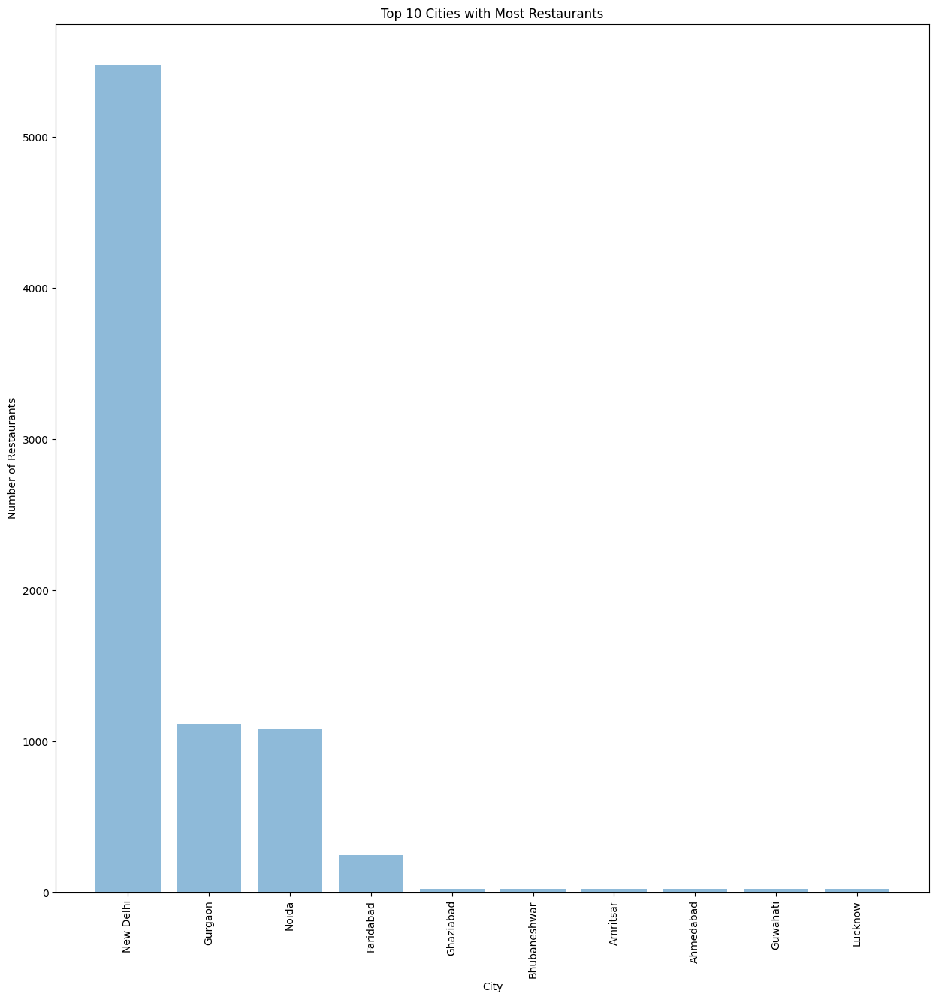

In [47]:
cities = list(city_count.keys())
counts = list(city_count.values())
y_pos = np.arange(len(cities))

plt.figure(figsize=(15, 15))
plt.bar(y_pos, counts, align='center', alpha=0.5)
plt.xticks(y_pos, cities, rotation=90)
plt.xlabel("City")
plt.ylabel("Number of Restaurants")
plt.title("Top 10 Cities with Most Restaurants")
plt.show()